In [1]:
%matplotlib inline

import os
import sys
import time
import ctypes
import multiprocessing
import warnings

import dicom
import csv
import pickle
import scipy
import numpy as np
import pandas as pd
import tensorflow as tf

from copy import deepcopy
from collections import namedtuple
from scipy.misc import imread
from scipy import stats
from scipy.ndimage.filters import gaussian_filter
from scipy.ndimage.measurements import center_of_mass
from scipy.interpolate import RegularGridInterpolator
from matplotlib import pyplot as plt

import fastaniso

In [3]:
_DCM_ROOT_DIR = 'images'
_LABELS_CSV = 'stage1_labels.csv'
_SAMPLE_CSV = 'stage1_sample_submission.csv'


def save(**kwargs):
    with open('save.dat', 'wb') as f:
        pickle.dump(kwargs, f)


def load():
    with open('save.dat', 'rb') as f:
        return pickle.load(f)
    

def make_ct_image(path, z):
    return {
        'path': path,
        'z': z
    }


def make_patient(ct_images, pos, pixel_spacing, label):
    return {
        'ct_images': ct_images,
        'pos': pos,
        'pixel_spacing': pixel_spacing,
        'label': label
    }   


def get_dcm_paths(root_dir):
    return [
        os.path.join(root_dir, f) for f in os.listdir(root_dir)
        if f.endswith('dcm')
    ]


def get_patient_labels(csv_fname):
    with open(csv_fname) as f:
        reader = csv.reader(f, delimiter=',')
        reader.next()  # skip header
        return dict([(r[0], float(r[1])) for r in reader if len(r) == 2])


def _to_array(a):
    return [float(x) for x in a]

    
def get_patient_data(dcm_paths, patient_labels, test_patient_names):
    result = {}
    for dcm_path in dcm_paths:
        try:
            ds = dicom.read_file(dcm_path)
            name = ds.PatientName
            x, y, z = _to_array(ds.ImagePositionPatient)
            pos = np.asarray([x, y])
            pixel_spacing=np.asarray(_to_array(ds.PixelSpacing))
            if not (name in patient_labels or
                    name in test_patient_names):
                print "Uninterested patient=%s"%name
                continue
            ct_image = make_ct_image(path=dcm_path, z=z)
            if name not in result:
                result[name] = make_patient(
                    ct_images=[ct_image],
                    pos=pos,
                    pixel_spacing=pixel_spacing,
                    label=patient_labels.get(name))
            else:
                patient = result[name]
                if np.linalg.norm(patient['pos'] - pos) > 1.0e-3:
                    print "Skip dcm_path=%s: inconsistent pos"%dcm_path
                    continue
                if np.linalg.norm(patient['pixel_spacing'] - pixel_spacing) > 1.0e-3:
                    print "Skip dcm_path=%s: inconsistent pixel_spacing"%dcm_path
                    continue
                patient['ct_images'].append(ct_image)
        except Exception as e:
            print "dcm_path=%s error:%s"%(dcm_path, e)
    for _, p in result.iteritems():
        p['ct_images'] = sorted(p['ct_images'], key=lambda x: x['z'])
    return result


def _read_ct_image3d(ct_images):
    images = []
    zs = []
    for ct_image in sorted(ct_images, key=lambda x: x['z']):
        path, z = ct_image['path'], ct_image['z']
        image = dicom.read_file(path).pixel_array
        # image = np.maximum(image, 0.0)
        images.append(image)
        zs.append(z)
    image3d = np.dstack(images).astype(np.float)
    #min_pixel_value = np.amin(image3d)
    #max_pixel_value = np.amax(image3d)
    #image3d = (image3d - min_pixel_value) * 1.0 / (max_pixel_value - min_pixel_value)
    return image3d, np.asarray(zs)


def _isotropic_interp(image3d, zs, pixel_spacing):
    xd, yd = pixel_spacing
    if abs(yd - xd) > 1.0e-3:
        print "Warning: incosistent pixel_spacing."
    d = (xd + yd) / 2.0

    def make_new_ax(old_ax, d, ndims):
        m = np.mean(old_ax)
        span = (ndims - 1) * d
        return np.linspace(m - span / 2.0, m + span / 2.0, ndims)
    new_zs = make_new_ax(zs, d, int((np.amax(zs) - np.amin(zs)) / d) + 1)

    interp_z_indexes = []
    i = 0
    for new_z in new_zs:
        while i < len(zs) and new_z > zs[i]:
            i += 1
        if i >= len(zs):
            break
        interp_z_indexes.append(i)
        
    new_images = []
    new_zs_tmp = []
    for new_z_index, post_z_index in enumerate(interp_z_indexes):
        prev_z_index = post_z_index - 1
        if prev_z_index < 0:
            continue
        prev_z = zs[prev_z_index]
        post_z = zs[post_z_index]
        new_z = new_zs[new_z_index]
        factor = float(new_z - prev_z) / (post_z - prev_z)
        assert factor >= 0.0 and factor <= 1.0
        new_images.append(
            (1.0 - factor) * image3d[:,:,prev_z_index] +
            factor * image3d[:,:,post_z_index])
        new_zs_tmp.append(new_z)
    assert abs(np.mean(np.diff(new_zs_tmp)) - d) <= 1.0e-3, "Wrong z pixel spacing."
    return np.dstack(new_images), d


def read_ct_image3d(patient):
    image3d, zs = _read_ct_image3d(patient['ct_images'])
    new_image3d, pixel_spacing = _isotropic_interp(
        image3d, zs, patient['pixel_spacing'])
    return new_image3d, pixel_spacing


def _block_indexes(arr_len, block_size):
    num_blocks = arr_len // block_size
    pad = arr_len - num_blocks * block_size
    offset = pad / 2
    ans = [offset + i * block_size for i in range(0, num_blocks)]
    # block_i's index = (ans[i], ans[i] + block_size) for i = 0, ..., len(ans)
    return ans


def _compute_entropy(image3d):
    num_bins = max(0, int(np.amax(image3d) - np.amin(image3d)))
    if num_bins == 0:
        return
    hist, _ = np.histogram(image3d.flat, bins=num_bins, density=False)
    prob = hist / float(sum(hist))
    return stats.entropy(prob)


def _opt_segment_threshold(image3d):
    th = np.percentile(image3d, 0.2)
    for i in range(10000):
        idx = (image3d < th)
        mu_b = image3d[idx]
        mu_o = image3d[~idx]
        new_th = (np.mean(mu_b) + np.mean(mu_o)) / 2.0
        if abs(new_th - th) < 1.0e-6:
            return th
        th = new_th


def process_ct_image3d(image3d, block_size,
                       entropy_min_th=4.0,
                       entropy_max_th=8.0):
    ny, nx, nz = image3d.shape
    x_block_indexes = _block_indexes(image3d.shape[1], block_size)
    y_block_indexes = _block_indexes(image3d.shape[0], block_size)
    z_block_indexes = _block_indexes(image3d.shape[2], block_size)
    
    def process_block(xbi, ybi, zbi):
        xyzbi0 = np.asarray((xbi, ybi, zbi))
        if np.linalg.norm(np.asarray((xbi, ybi)) + block_size / 2.0 -
                          np.asarray((nx, ny)) / 2.0) > min(nx, ny) / 2.0:
            return
        xyzbi = xyzbi0.copy()
        for i in range(10000):
            xbi, ybi, zbi = xyzbi
            hero = image3d[
                ybi:ybi + block_size,
                xbi:xbi + block_size,
                zbi:zbi + block_size
            ]
            entropy = _compute_entropy(hero)
            if entropy is None:
                print "Erro: invalid entropy."
                return 
            if entropy < entropy_min_th or entropy > entropy_max_th:
                print "Error: entropy too small or too big."
                return
            
            hero = gaussian_filter(hero, 1.0)
            hero = fastaniso.anisodiff3(ta, niter=5, option=1)
            opt_th = _opt_segment_threshold(hero)
            if opt_th is None:
                print "Error: fail to get opt segment threshold."
                return
            hero = (hero >= opt_th)
            loc_yi, loc_xi, loc_zi = np.asarray(center_of_mass(hero))
            loc_xyzbi = np.asarray((loc_xi, loc_yi, loc_zi)) - block_size / 2.0
            loc_xyzbi = loc_xyzbi.astype(np.int)
            new_xyzbi = xyzbi + loc_xyzbi
            if np.linalg.norm(new_xyzbi - xyzbi) < 1.0e-3:
                return xyzbi
            elif np.linalg.norm(new_xyzbi - xyzbi0) > block_size:
                print "Error: location move too big"
                return
            xyzbi = new_xyzbi
        print "Error: fail to process block."
        
    ans_blocks = []
    for xbi in x_block_indexes:
        for ybi in y_block_indexes:
            for zbi in z_block_indexes:
                ans_block = process_block(xbi, ybi, zbi)
                if ans_block is not None:
                    ans_blocks.append(ans_block)
    return ans_blocks

In [183]:
ans_blocks = process_ct_image3d(
    image3d, block_size=32,
    entropy_min_th=4,
    entropy_max_th=8)

Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: entropy too small or too big.
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move too big
Error: location move to

In [184]:
len(ans_blocks)

0

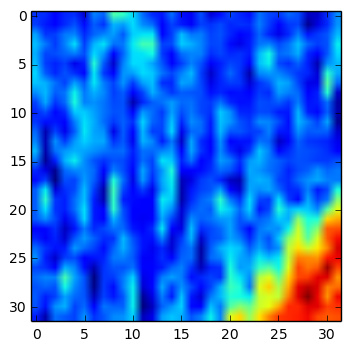

In [138]:
xbi, ybi, zbi = ans_blocks[100]
image_block3d = image3d[
    ybi:ybi + block_size,
    xbi:xbi + block_size,
    zbi:zbi + block_size
]
plt.imshow(image_block3d[:,:,23])

In [ ]:
# read all data
dcm_paths = get_dcm_paths(_DCM_ROOT_DIR)
patient_labels = get_patient_labels(_LABELS_CSV)
test_patient_names = set(get_patient_labels(_SAMPLE_CSV).keys())
patient_data = get_patient_data(dcm_paths, patient_labels, test_patient_names)

# save all data
save(dcm_paths=dcm_paths,
     patient_labels=patient_labels,
     test_patient_names=test_patient_names,
     patient_data=patient_data)

In [4]:
# load all data
all_data = load()
dcm_paths = all_data['dcm_paths']
patient_labels = all_data['patient_labels']
test_patient_names = all_data['test_patient_names']
patient_data = all_data['patient_data']

In [5]:
p1 = patient_data[patient_data.keys()[0]]
image3d1, pixel_spacing1 = read_ct_image3d(p1)
ds1 = dicom.read_file(p1['ct_images'][20]['path'])

In [6]:
p2 = patient_data[patient_data.keys()[500]]
image3d2, pixel_spacing2 = read_ct_image3d(p2)
ds2 = dicom.read_file(p2['ct_images'][20]['path'])

In [62]:
p3 = patient_data['0ca943d821204ceb089510f836a367fd']
image3d3, pixel_spacing3 = read_ct_image3d(p3)
ds3 = dicom.read_file(p3['ct_images'][20]['path'])

In [55]:
patient_labels

{'059d8c14b2256a2ba4e38ac511700203': 1.0,
 '66b7666912e1d469cd9817a1cade694c': 0.0,
 '185bc9d9fa3a58fea90778215c69d35b': 1.0,
 'fd4c2d4738bc25a5c331dbc101f3323a': 0.0,
 '0d19f1c627df49eb223771c28548350e': 0.0,
 '92d5f6230c3b6f6256e57d30981c1aaf': 0.0,
 '64a5a866461a3b6006efb0075e04dffe': 1.0,
 '274297dd9a4f66148754944ae2b6731c': 0.0,
 'f3f6f40ccb01276d722d52701cab1754': 1.0,
 '16377fe7caf072d882f234dbbff9ef6c': 0.0,
 'f228862e9f9c6ad7993ded4e088c5050': 0.0,
 'f69c80f898c9dfd8d3595b7ca7b8c66c': 0.0,
 'af2b9f7d489ffab8e3590658853cacf8': 0.0,
 '7917af5df3fe5577f912c5168c6307e3': 1.0,
 '63b5be42543c98ac5392f1bfbda085bf': 1.0,
 '0ca943d821204ceb089510f836a367fd': 0.0,
 '59e4e8889ae68a75227b2bd02c1d1b96': 0.0,
 'db7c113445db32f9beaf5dc90e7218ad': 0.0,
 '20c73e37fc89e007ae5b242480830860': 0.0,
 '321364cc2393dccb7ba8894ee9d2b269': 0.0,
 'f82560aeea0309873716efe3aa71ef0a': 0.0,
 'bb94bc5dd4656a2387bafb6098311175': 0.0,
 'c2af7c1d6159ae152a79f32d88c33ab2': 0.0,
 '6cb2908fd789700db727dd96526bc342

In [64]:
p3['label']

0.0

In [14]:
x = _read_ct_image3d(p1['ct_images'])

In [29]:
y = _read_ct_image3d(p2['ct_images'])

In [65]:
z = _read_ct_image3d(p3['ct_images'])

In [66]:
z[0].shape

(512, 512, 147)

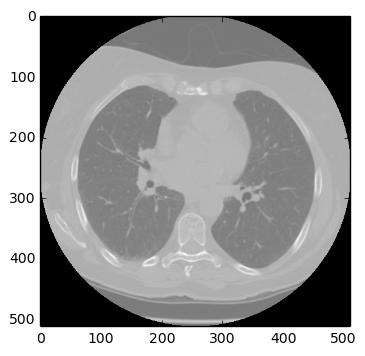

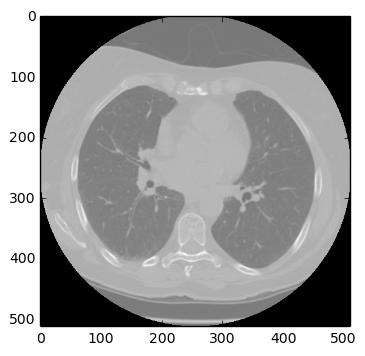

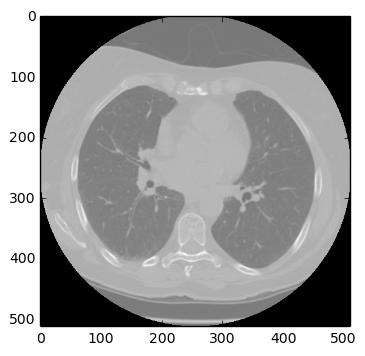

In [67]:
for i in [int(z[0].shape[2]/2)-1, int(z[0].shape[2]/2), int(z[0].shape[2]/2)+1]:
    plt.figure()
    plt.imshow(z[0][:,:,65], cmap='gray')

In [187]:
p1['label'], p2['label']

(1.0, 0.0)

In [188]:
image3d, pixel_spacing = image3d1, pixel_spacing1

In [189]:
image3d.shape

(512, 512, 442)

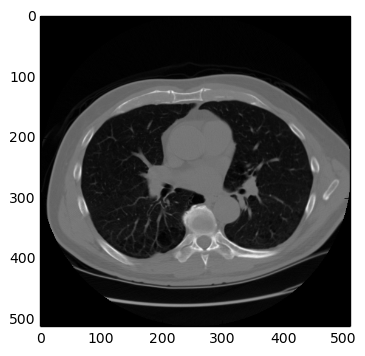

In [190]:
plt.figure()
plt.imshow(image3d1[:,:,221], cmap="gray")

In [194]:
ny, nx, nz = image3d.shape
x_block_indexes = _block_indexes(image3d.shape[1], block_size)
y_block_indexes = _block_indexes(image3d.shape[0], block_size)
z_block_indexes = _block_indexes(image3d.shape[2], block_size)

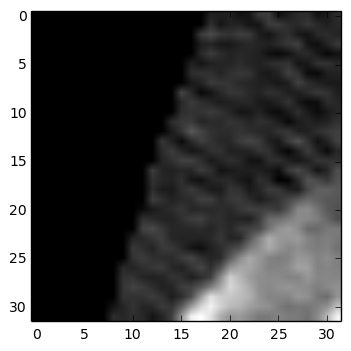

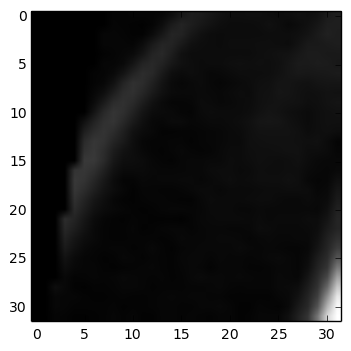

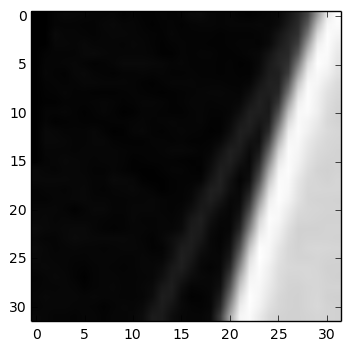

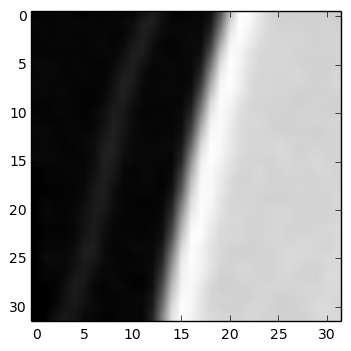

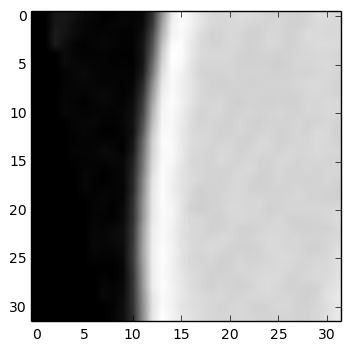

...

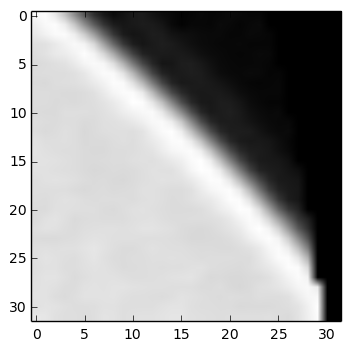

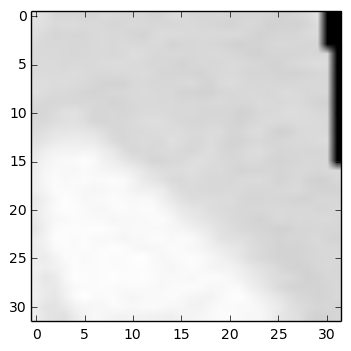

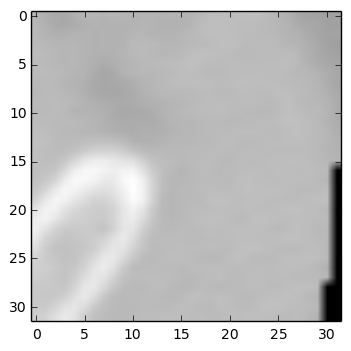

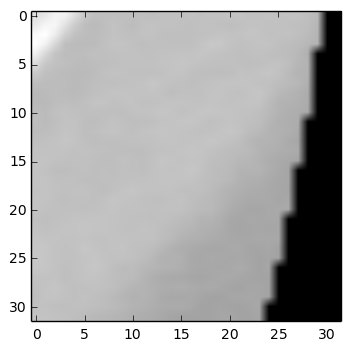

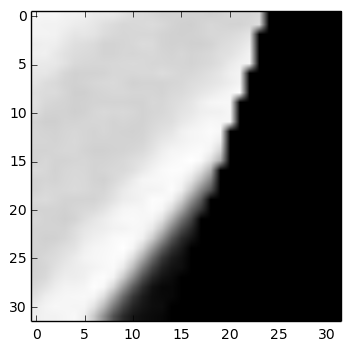

In [195]:
for xbi in x_block_indexes:
    for ybi in y_block_indexes:
        if np.linalg.norm(np.asarray((xbi, ybi)) + block_size / 2.0 -
                          np.asarray((nx, ny)) / 2.0) > min(nx, ny) / 2.0:
            continue
        hero = image3d[
            ybi:ybi + block_size,
            xbi:xbi + block_size,
            221
        ]
        plt.figure()
        plt.imshow(hero, cmap='gray')

In [8]:
block_sizes = [32, 24, 16, 12, 8]

In [9]:
tic = time.time()
cnts = []
for block_size in block_sizes:
    cnts.append(process_ct_image3d(
        image3d, block_size=block_size,
        entropy_min_th=4,
        entropy_max_th=8))
toc = time.time()
print toc - tic

45.3940501213


In [10]:
cnts

[0.7639508928571429,
 0.7736006683375104,
 0.7482489224137931,
 0.7629513343799058,
 0.7342866042564655]

In [ ]:
##########################################################################

In [11]:
block_size=32
x_block_indexes = _block_indexes(image3d.shape[1], block_size)
y_block_indexes = _block_indexes(image3d.shape[0], block_size)
z_block_indexes = _block_indexes(image3d.shape[2], block_size)

In [12]:
x_block_indexes 

[0, 32, 64, 96, 128, 160, 192, 224, 256, 288, 320, 352, 384, 416, 448, 480]

In [79]:
xbi, ybi, zbi = (
    x_block_indexes[12],
    y_block_indexes[9],
    z_block_indexes[10]
)
image_block3d = image3d[
    ybi:ybi + block_size,
    xbi:xbi + block_size,
    zbi:zbi + block_size
]
num_bins = max(0, int(np.amax(image_block3d) - np.amin(image_block3d)))
if num_bins > 0:
    hist, _ = np.histogram(image_block3d.flat, bins=num_bins, density=False)
    prob = hist / float(sum(hist))
    print scipy.stats.entropy(prob)

5.53567386914


In [80]:
image_block3d.shape

(32, 32, 32)

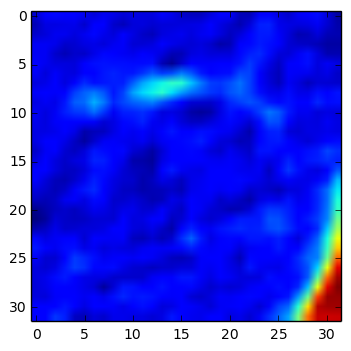

In [81]:
sample_z=16
plt.imshow(image_block3d[:,:,sample_z])

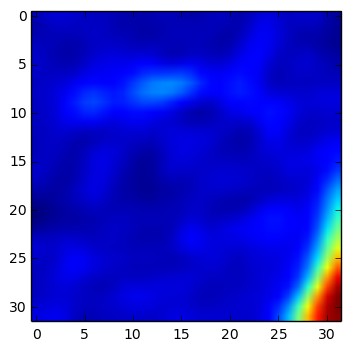

In [82]:
ta = gaussian_filter(image_block3d, 1)
plt.imshow(ta[:,:,sample_z])

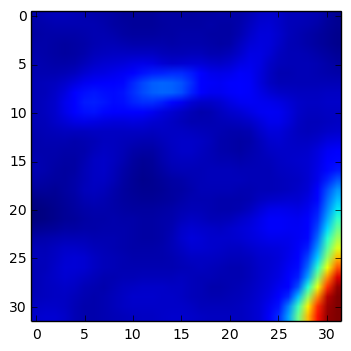

In [83]:
tb = fastaniso.anisodiff3(ta, niter=5, option=1)
plt.imshow(tb[:,:,sample_z])

In [84]:
x = tb.reshape([-1])

In [85]:
th = np.percentile(x, 0.1)
while True:
    idx = (x < th)
    mu_b = x[idx]
    mu_o = x[~idx]
    new_th = (np.mean(mu_b) + np.mean(mu_o)) / 2.0
    if abs(new_th - th) < 1.0e-6:
        break
    th = new_th

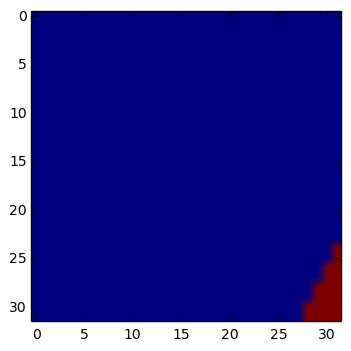

In [86]:
plt.imshow(tb[:,:,sample_z]>=th)

In [87]:
tb.shape

(32, 32, 32)

In [93]:
y, x, z = center_of_mass(tb>=th)

In [94]:
y, x, z = int(y - block_size / 2.0), int(x - block_size / 2.0), int(z - block_size / 2.0)

In [95]:
y, x, z

(9, 12, 8)

In [96]:
tc = image3d[
    ybi + y:ybi + y + block_size,
    xbi + x:xbi + x + block_size,
    zbi + z:zbi + z + block_size
]

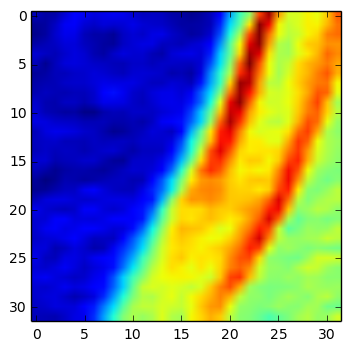

In [97]:
plt.imshow(tc[:,:,sample_z])